In [1]:
import torch
import numpy as np

from scipy import ndimage

from PIL import Image
import matplotlib.pyplot as plt

from build123d import *
from OCP import BRepBuilderAPI, gp

In [2]:
model_zoe_k = torch.hub.load("ZoeDepth", "ZoeD_K", source="local", pretrained=True)

Overwriting config with config_version kitti
img_size [384, 768]


Using cache found in /home/erik/.cache/torch/hub/intel-isl_MiDaS_master
/home/erik/3dprinting/hthv4_egg_waffle_logo3d/.pixi/envs/default/lib/python3.12/site-packages/torch/functional.py:534: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at /home/conda/feedstock_root/build_artifacts/libtorch_1730824440083/work/aten/src/ATen/native/TensorShape.cpp:3595.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


Params passed to Resize transform:
	width:  768
	height:  384
	resize_target:  True
	keep_aspect_ratio:  True
	ensure_multiple_of:  32
	resize_method:  minimal
Using pretrained resource url::https://github.com/isl-org/ZoeDepth/releases/download/v1.0/ZoeD_M12_K.pt
Loaded successfully


In [3]:
im_hth3 = Image.open('hth3_background.jpg')
arr_grey_hth3 = np.array(im_hth3).mean(axis=-1)

In [4]:
depth_hth3 = model_zoe_k.infer_pil(im_hth3, output_type='numpy')

In [5]:
normed_depth_hth3 = (depth_hth3 - np.min(depth_hth3)) / np.ptp(depth_hth3)

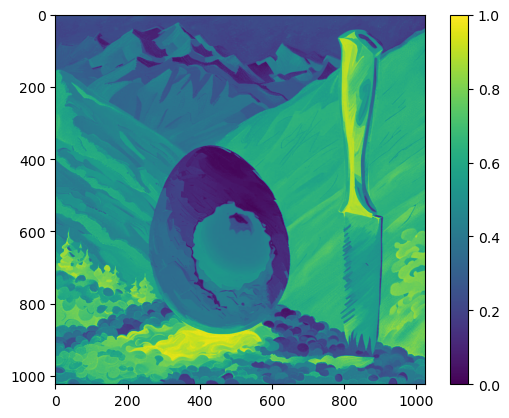

In [6]:
rescaled_burn = -(normed_depth_hth3 + arr_grey_hth3)
rescaled_burn = (rescaled_burn-np.min(rescaled_burn)) / np.ptp(rescaled_burn)

plt.imshow(rescaled_burn)
plt.colorbar();

(0.019597072833307454, 0.9529093991698192)

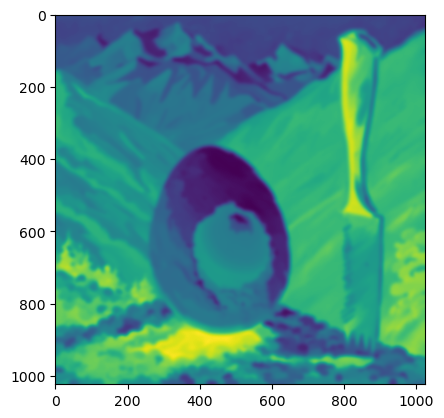

In [7]:
hth3_depth = ndimage.gaussian_filter(rescaled_burn, 5)


plt.imshow(hth3_depth)
np.min(hth3_depth), np.max(hth3_depth)

See [depth_mesh_maker.ipynb](depth_mesh_maker.ipynb) for details on this

In [8]:
def make_occ_mesh_faces(imgarr, rescale_xy=None):
    faces = []

    if rescale_xy is None:
        isc = jsc = 1
    else:
        isc = (imgarr.shape[0]-1) / float(rescale_xy)
        jsc = (imgarr.shape[1]-1) / float(rescale_xy)

    for i in range(imgarr.shape[0]-1):
        for j in range(imgarr.shape[1]-1):
            verts = ((i/isc, j/jsc, imgarr[i,j]), 
                     (i/isc, (j+1)/jsc, imgarr[i, j+1]), 
                     ((i+1)/isc, (j+1)/jsc, imgarr[i+1, j+1]), 
                     ((i+1)/isc, j/jsc, imgarr[i+1, j]))
            p0, p1, p2, p3 = (gp.gp_Pnt(*c) for c in verts)

            for ps in ((p0, p1, p2), (p0,p2,p3)):
                polygon_builder = BRepBuilderAPI.BRepBuilderAPI_MakePolygon(*ps, Close=True)
                face_builder = BRepBuilderAPI.BRepBuilderAPI_MakeFace(polygon_builder.Wire())
                face = face_builder.Face()
                faces.append(face)

    return faces

def polyface_from_verts(verts):
    
    polygon_builder = BRepBuilderAPI.BRepBuilderAPI_MakePolygon()
    for vs in verts:
        polygon_builder.Add(gp.gp_Pnt(*vs))
    polygon_builder.Close()
    face_builder = BRepBuilderAPI.BRepBuilderAPI_MakeFace(polygon_builder.Wire())
    return face_builder.Face()

def make_mesh_sides(imgarr, rescale_xy=None):
    if rescale_xy is None:
        isc = jsc = 1
    else:
        isc = (imgarr.shape[0]-1) / float(rescale_xy)
        jsc = (imgarr.shape[1]-1) / float(rescale_xy)

    iedge = (imgarr.shape[0]-1) / isc
    jedge = (imgarr.shape[1]-1) / jsc

    verts = [(i/isc, 0, imgarr[i, 0]) for i in range(imgarr.shape[0])]
    verts = [(0,0,0)] + verts + [(iedge, 0, 0)]
    iplus = polyface_from_verts(verts)
    
    verts = [(i/isc, jedge, imgarr[i, imgarr.shape[1]-1]) for i in range(imgarr.shape[0])]
    verts = [(0,jedge,0)] + verts + [(iedge, jedge, 0)]
    iminus = polyface_from_verts(verts)

    verts = [(0, j/jsc, imgarr[0, j]) for j in range(imgarr.shape[1])]
    verts = [(0,0,0)] + verts + [(0, jedge, 0)]
    jplus = polyface_from_verts(verts)  
    
    verts = [(iedge, j/jsc, imgarr[imgarr.shape[0]-1, j]) for j in range(imgarr.shape[1])]
    verts = [(iedge,0,0)] + verts + [(iedge, jedge, 0)]
    jminus = polyface_from_verts(verts)    

    bottom = polyface_from_verts([(iedge, 0, 0), 
                                  (iedge, jedge, 0), 
                                  (0, jedge, 0), 
                                  (0, 0, 0)])


    return [iplus, iminus, jplus, jminus, bottom]

def make_mesh_box(imgarr, rescale_xy=None, make_solid=True):
    mesh_faces = make_occ_mesh_faces(imgarr, rescale_xy)
    side_faces = make_mesh_sides(imgarr, rescale_xy)

    ofaces = mesh_faces + side_faces

    if make_solid:
        faces = [Face(f) for f in ofaces]
        return Solid(Shell(faces))
    else:
        return ofaces

In [10]:
width = 50
height = 15
image_extent = 20

meshbox = make_mesh_box(hth3_depth[::5, ::5]*image_extent, width)
combined = Pos(-width/2, -width/2, height)*meshbox + extrude(Rectangle(width, width), height)
combined

Part at 0x7d8e3718e600, label(), #children(0)

In [11]:
export_stl(combined, 'hth3_stamp.stl')

True